**Content:**
1. [Цель исследования](#1)
2. [Импорт библиотек](#2)
3. [Импорт датасета](#3)
4. [Загрузчик изображений](#4)
5. [Метрика качества](#5)
6. [Функция потерь](#6)
    1. [BCE](#7)
    1. [DICE](#8)
    1. [Focal](#9)
    1. [Weakly supervised regularization](#10)
7. [Функции обучения, построения графиков, предсказания](#11)
8. [Реализация нейросетевых архитектур для сегментации](#12)
    1. [SegNet](#13)
    1. [Unet](#14)
    1. [Unet2](#15)
9. [Сравнение метрик IoU по эпохам обучения](#16)
10. [Сравнение метрик IoU по эпохам в зависимости от loss-функции](#17)
11. [Сравнение метрик IoU на тестовом наборе данных](#18)
12. [Вывод](#19)



# <h3 style="text-align: center;"><b>Исследование: влияние архитектуры CNN и функции потерь при сегментации изображений </b></h3>

---

<a id="1"></a> <br><a id="1"></a> <br>
# 1. **Цель исследования** : 

определить более результитивную архетектуру для сегментации кожного заболевания Меланома - SegNet или UNet, а также сравнить влияние на результативность различных функций потерь. Данное заболевание возможно перепутать с родимыми пятнами из-за схожей внешней структуры. В данном проекте мы не будем заниматься их классификацией, а будем **сегментировать**:
<table><tr><td>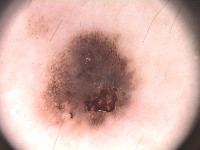</td><td>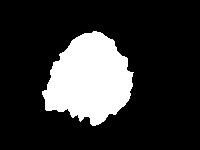</td></tr></table>







<a id="2"></a> <br><a id="1"></a> <br>
# 2. Импорт библиотек:

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from torch.optim import lr_scheduler
from time import time
import torch
!pip install torchsummary
from torchsummary import summary
from torch.utils.data import DataLoader

import numpy as np
from skimage.io import imread
import os
from skimage.transform import resize
from time import time
import tqdm

import matplotlib.pyplot as plt
from IPython.display import clear_output
from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)
from matplotlib import cm
colors = cm.get_cmap("viridis", 12).colors

<a id="3"></a> <br><a id="1">
# 3. **Импорт датасета**

Скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

In [2]:
!apt install unrar
!unrar x 

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  unrar
0 upgraded, 1 newly installed, 0 to remove and 65 not upgraded.
Need to get 113 kB of archives.
After this operation, 406 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/multiverse amd64 unrar amd64 1:5.6.6-2build1 [113 kB]
Fetched 113 kB in 1s (182 kB/s) 

78Selecting previously unselected package unrar.
(Reading database ... 113807 files and directories currently installed.)
Preparing to unpack .../unrar_1%3a5.6.6-2build1_amd64.deb ...
7Progress: [  0%] [..........................................................] 87Progress: [ 20%] [###########...............................................] 8Unpacking unrar (1:5.6.6-2build1) ...
7Progress: [ 40%] [#######################...................................] 8Setting up unrar (1:5.6.6-2build1) ...
7Progress: [ 60%] [########################

In [3]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
#!wget -c https://www.kaggle.com/datasets/kanametov/ph2dataset #запасной вариант

--2024-06-17 14:42:40--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/xk3foy6dv46dlhr2yp0xn/PH2Dataset.rar?rlkey=jmxki4aywtmr8ycf0b0bz9q70 [following]
--2024-06-17 14:42:41--  https://www.dropbox.com/scl/fi/xk3foy6dv46dlhr2yp0xn/PH2Dataset.rar?rlkey=jmxki4aywtmr8ycf0b0bz9q70
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uceba8e3996f6d9d486af3f1ab5f.dl.dropboxusercontent.com/cd/0/inline/CVDO2uQW7ji-t1VJ-MpPq_jGvIqgw6-yXdyLxzrv_RGF1dAsDzFjfVOYmtjd4OmYE5-evkQM1VIkzxy9jObIfLmwoXQC0tCgqZBSTLWzFlG9AbcE7y_3W1ygPjbKofEJhhE/file# [following]
--2024-06-17 14:42:41--  https://uceba8e3996f6d9d486af3f1ab5f.dl.dropboxusercontent.com/cd/0/inline/CVDO2uQW7ji-t1VJ

In [4]:
!ls

PH2Dataset.rar


In [5]:
get_ipython().system_raw("unrar x PH2Dataset.rar")


UNRAR 5.61 beta 1 freeware      Copyright (c) 1993-2018 Alexander Roshal


Extracting from PH2Dataset.rar

Creating    PH2Dataset                                                OK
Creating    PH2Dataset/PH2 Dataset images                             OK
Creating    PH2Dataset/PH2 Dataset images/IMD002                      OK
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image  OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image/IMD002.bmp     0  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion        OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion/IMD002_lesion.bmp     0  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi           OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi/IMD002_R1_Label4.bmp     0  OK 
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi/IMD002_R2_Label3.bmp     0  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD003                      OK
Crea

Стуктура датасета::

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

In [6]:
images = []
lesions = []
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения в датасете имеют разные размеры. Изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений используем `skimage.transform.resize()`.
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [7]:
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [8]:
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [9]:
len(lesions)

200

Чтобы убедиться, что загрузка прошла корректно, отобразим несколько изображений:

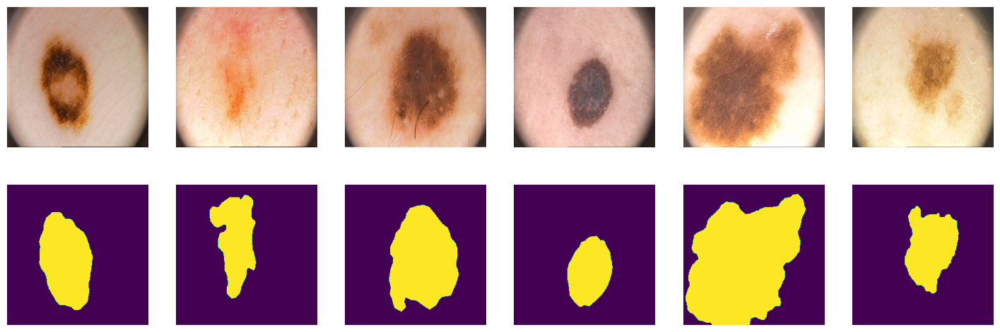

In [34]:
plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим датасет из 200 изображений в соотношении 2:1:1 для обучения, валидации и теста соответственно:

In [35]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [36]:
print(len(tr), len(val), len(ts))

100 50 50


<a id="4"></a> <br>
# 4. Загрузчик изображений:

Для загрузки и предварительной обработки данных для моделей глубокого обучения используем pytorch dataloader:

In [37]:
batch_size = 16 #ограничения вычислительных мощностей не позволяют использовать батчи большего размера

data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)

data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [39]:
for x_batch in data_tr:
    print(x_batch[0].shape)
for y_batch in data_tr:
    print(x_batch[0].shape)

torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])
torch.Size([4, 3, 256, 256])


In [40]:
for x_batch in data_val:
    print(x_batch[0].shape)
for y_batch in data_val:
    print(x_batch[0].shape)

torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])


In [41]:
for x_batch in data_ts:
    print(x_batch[0].shape)
for y_batch in data_ts:
    print(x_batch[0].shape)

torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([16, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])
torch.Size([2, 3, 256, 256])


<a id="5"></a> <br>
# 5. Метрика качества

Для оценки качества моделей и их сравнения на валидационном или тестовом наборе данных используем метрику IoU. Она помогает понять, насколько точно модель сегментирует объекты и расчитывается по формуле:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):

![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [42]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    outputs = outputs.squeeze(1).byte()
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    
    intersection = (outputs.detach() & labels).float().sum((1, 2))
    union = (outputs | labels).float().sum((1, 2))
    iou = (intersection + SMOOTH) / (union + SMOOTH)
    
    return iou

<a id="6"></a> <br>
# 6. Функции потерь

<a id="7"></a> <br>
## 6.1 Binary Cross-Entropy

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [43]:
def bce_loss(y_pred, y_real):
    loss = torch.maximum(y_pred, torch.zeros_like(y_pred)) - y_pred*y_real + torch.log(1+torch.exp(-torch.abs(y_pred)))
    return loss.mean((1,2,3)).mean()

<a id="8"></a> <br>
## 6.2 Dice coefficient: 

Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [44]:
def dice_loss(y_pred, y_real, smooth=1): #параметр smooth решает проблему возможной нестабильности функции
    y_pred = torch.sigmoid(y_pred)
    num = (2*y_pred*y_real).sum((1,2,3)) + smooth
    den = (y_pred + y_real).sum((1,2,3)) + smooth
    res = 1 - (num/den).mean()
    return res 

<a id="9"></a> <br>
## 6.3 [Focal](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [45]:
def focal_loss(y_pred, y_real, eps = -1, gamma = 2):
    p = torch.sigmoid(y_pred)
    ce_loss = torch.maximum(y_pred, torch.zeros_like(y_pred)) - y_pred*y_real + torch.log(1+torch.exp(-torch.abs(y_pred)))
    p_t = p * y_real + (1 - p) * (1 - y_real)
    loss = ce_loss * ((1 - p_t) ** gamma)
    if eps >= 0:
        alpha_t = eps * y_real + (1 - eps) * (1 - y_real)
        loss = alpha_t * loss
    loss = loss.mean((1,2,3)).mean()
    return loss

<a id="10"></a> <br>
## 6.4 [Weakly supervised regularization](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)

In [46]:
def supervised_loss(y_pred, y_real, lamda=0.2, n=256, m=256):
    binary_cross_loss = bce_loss(y_pred, y_real)

    y_real = y_real.squeeze(1).byte()
    y_pred = y_pred.squeeze(1).byte()

    bstch_size = 10
    contiguity_loss = (
                      torch.abs(y_pred[:,1:,:] - y_pred[:,:-1,:]).sum(dim=(1, 2)) + \
                      torch.abs(y_pred[:,:,1:] - y_pred[:,:,:-1]).sum(dim=(1, 2))
    ).sum() / batch_size # batch-wise meaning
    contiguity_loss /= n * m
    sparcity_loss = torch.abs(y_pred).sum() / (n * m)

    return binary_cross_loss + lamda * (sparcity_loss + contiguity_loss)

<a id="11"></a> <br>
## 7 Функции обучения, построения графиков, предсказания: 


In [47]:
MAX_EPOCHS = 100
BASE_LR = 3e-4
WEIGHT_DECAY = 0.01
AMSGRAD = False

In [48]:
def train(model, optimizer, loss_fn, epochs, data_tr, data_val, used_sheduler=True):
    X_val, Y_val = next(iter(data_val))
    history = {"epochs": np.arange(epochs)+1, "train": {"score": [], "loss": []},  "val": {"score": [], "loss": []}}
    if used_sheduler:
        scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[epochs//3,epochs//2,epochs//1.4,epochs//1.1], gamma=0.8)

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        avg_score = 0
        avg_loss_val = 0
        avg_score_val = 0

        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)

            # set parameter gradients to zero
            optimizer.zero_grad()

            # forward
            Y_pred = model(X_batch)
            loss =  loss_fn(Y_pred, Y_batch) # forward-pass
            loss.backward()  # backward-pass
            optimizer.step()  # update weights
            score = iou_pytorch(torch.sigmoid(Y_pred) > 0.5, Y_batch).mean().item()

            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
            avg_score += score/ len(data_tr)
        toc = time()
        print('loss: %f' % avg_loss)
        if used_sheduler:
            scheduler.step()

        # show intermediate results
        with torch.no_grad():
            model.eval() 

            Y_hat = model(X_val.to(device)).detach().to("cpu") # detach and put into cpu
            loss_val = loss

            # Visualize tools
            clear_output(wait=True)

            for Xv_batch, Yv_batch in data_val:
                Xv_batch = Xv_batch.to(device)
                Yv_batch = Yv_batch.to(device)
                Y_pred_val = model(Xv_batch)
                loss_val = loss_fn(Y_pred_val, Yv_batch)
                score_val = iou_pytorch(torch.sigmoid(Y_pred_val) > 0.5, Yv_batch).mean().item()
                avg_loss_val += loss / len(data_val)
                avg_score_val += score_val/ len(data_val)
            
        history["train"]["score"].append(avg_score)
        history["val"]["score"].append(avg_score_val)
        history["train"]["loss"].append(avg_loss.item())
        history["val"]["loss"].append(avg_loss_val.item())
        fig, ax = plt.subplots(3, 6, figsize = (14, 12))

        for k in range(6):
            ax[0, k].imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            ax[0, k].set_title("Real")
            ax[0, k].axis('off')
            ax[1, k].imshow(torch.sigmoid(Y_hat[k, 0]) > 0.5, cmap='gray')
            ax[1, k].set_title("Output")
            ax[1, k].axis('off') 
            ax[2, k].imshow(Y_val[k, 0], cmap='gray')
            ax[2, k].set_title("Ground Truth")
            ax[2, k].axis('off')                    
        plt.suptitle('%d / %d - train_loss: %f , val_loss: %f, train_score: %f, val_score: %f' % (epoch+1, epochs, avg_loss, avg_loss_val, avg_score, avg_score_val))
        plt.tight_layout()
        plt.show()

   # очистка кеша

    X_batch.to("cpu")
    Y_batch.to("cpu")
    Xv_batch.to("cpu")
    Yv_batch.to("cpu")
    del model
    del X_batch
    del Y_batch
    del Xv_batch
    del Yv_batch
    torch.cuda.empty_cache()

    return history

In [49]:
def predict(model, data):
    model.eval()  # testing mode
    with torch.no_grad():
        Y_pred = [model(X_batch) for X_batch, _ in data]
    return np.array(Y_pred)

In [50]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    with torch.no_grad():
        for X_batch, Y_label in data:
            Y_pred = torch.sigmoid(model(X_batch.to(device))) > 0.5
            scores += metric(Y_pred, Y_label.to(device)).mean().item()
    return scores/len(data)

#Функция для построения графиков лосса и скора по эпохам
def make_graph(history, model_name, loss_name):
    fig, ax = plt.subplots(1, 2, figsize = (14, 7))
    x = history["epochs"]
    loss_train = history["train"]["loss"]
    loss_val = history["val"]["loss"]
    score_train = history["train"]["score"]
    score_val = history["val"]["score"]
    ax[0].plot(x, loss_train, label = "train", color = "green")
    ax[0].plot(x, loss_val, label = "val", color = "orange")
    ax[0].legend(fontsize = 14)
    ax[0].grid(linestyle = "--")
    ax[0].tick_params(labelsize = 14)
    ax[0].set_xlabel("epoch", fontsize = 14)
    ax[0].set_ylabel("loss", fontsize = 14)
    ax[0].set_title("Loss vs epoch", fontsize = 16)
    ax[0].set_xlim(left = 0, right = x.max())
    ax[0].set_ylim(bottom = 0)
    ax[1].plot(x, score_train, label = "train", color = "green")
    ax[1].plot(x, score_val, label = "val", color = "orange")
    ax[1].legend(fontsize = 14)
    ax[1].grid(linestyle = "--")
    ax[1].tick_params(labelsize = 14)
    ax[1].set_xlabel("epoch", fontsize = 14)
    ax[1].set_ylabel("score", fontsize = 14)
    ax[1].set_title("Score vs epoch", fontsize = 16)
    ax[1].set_xlim(left = 0, right = x.max())
    ax[1].set_ylim(bottom = 0)
    plt.suptitle(f"Model = {model_name}, loss = {loss_name}", fontsize = 18, y=1.05)
    plt.tight_layout()
    plt.show()

#Функция для вычисления скора на валидации и тесте уже обученной модели
def scores(model):
    val_score = score_model(model, iou_pytorch, data_val)
    test_score = score_model(model, iou_pytorch, data_ts)
    print(f"\nScore на валидации: {val_score:.4f}, score на тесте: {test_score:.4f}")
    return val_score, test_score

<a id="12"></a> <br>
# 8. Реализация архитектур:

-----------------------------------------------------------------------------------------
<a id="13"></a> <br>
## 8.1 SegNet

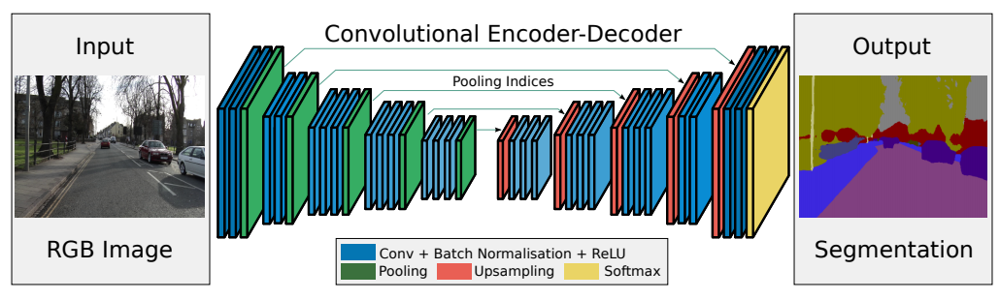

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

In [51]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        input_nbr = 3 #Число каналов входного изображения
        num_ch = 64 #Число каналов после свертки
        batchNorm_momentum = 0.1


        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = input_nbr, out_channels = num_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)  # 256 -> 128

        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch*2, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*2, out_channels = num_ch*2, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 128 -> 64

        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*2, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 64 -> 32

        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.bottleneck_pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.bottleneck_upsample = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.bottleneck_dec = nn.Sequential(          
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*8, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*8, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*4, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*4, out_channels = num_ch*2, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2) # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch*2, out_channels = num_ch*2, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch*2, out_channels = num_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2)# 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels = num_ch, out_channels = 1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e0, ind0 = self.pool0(e0)
        e1 = self.enc_conv1(e0)
        e1, ind1 = self.pool1(e1)
        e2 = self.enc_conv2(e1)
        e2, ind2 = self.pool2(e2)
        e3 = self.enc_conv3(e2)
        e3, ind3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(e3)
        b, ind_b = self.bottleneck_pool(b)
        b = self.bottleneck_upsample(b, ind_b)
        b = self.bottleneck_dec(b)

        # decoder
        d0 = self.upsample0(b, ind3)
        d0 = self.dec_conv0(d0)
        d1 = self.upsample1(d0, ind2)
        d1 = self.dec_conv1(d1)
        d2 = self.upsample2(d1, ind1)
        d2 = self.dec_conv2(d2)
        d3 = self.upsample3(d2, ind0)
        d3 = self.dec_conv3(d3) # no activation  

        return d3

In [52]:
print(summary(SegNet().to(device), (3, 256, 256)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7  [[-1, 64, 128, 128], [-1, 64, 128, 128]]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14  [[

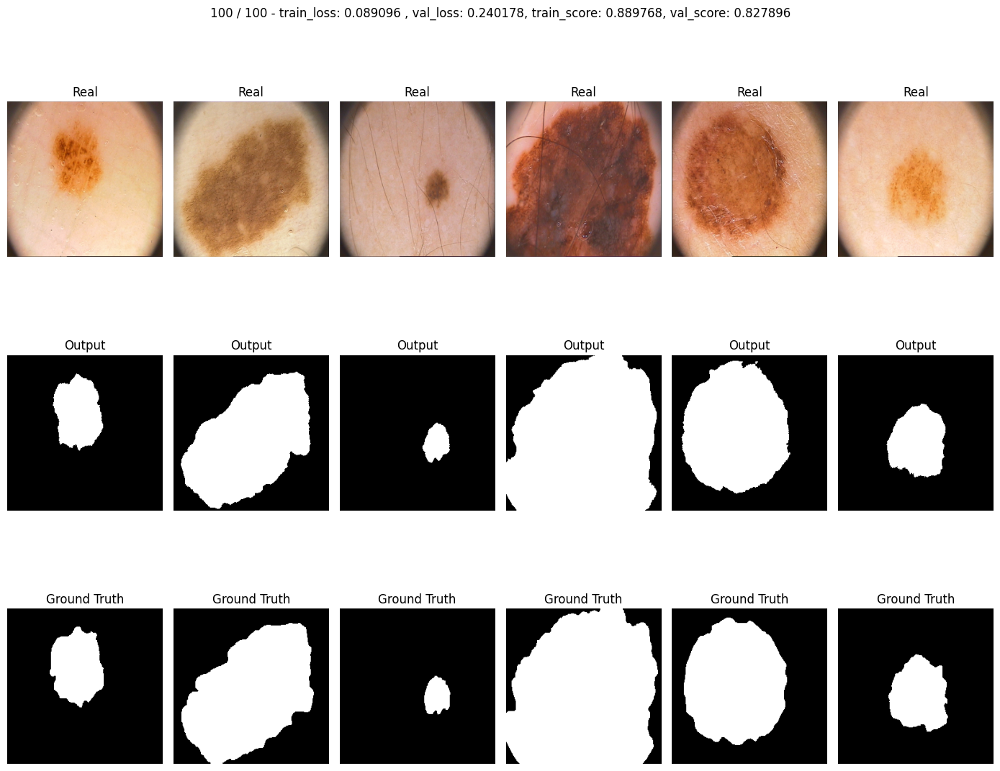

In [53]:
model = SegNet().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_segnet_bce = train(model, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [54]:
segnet_bce_val_score, segnet_bce_test_score = scores(model)


Score на валидации: 0.8352, score на тесте: 0.8274


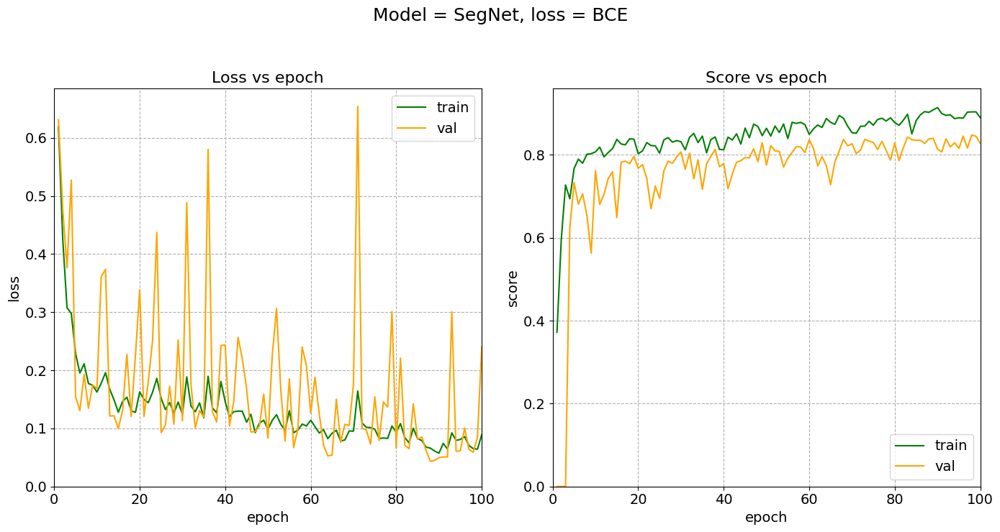

In [55]:
make_graph(h_segnet_bce, "SegNet", "BCE")

In [56]:
model.to("cpu")
del model
torch.cuda.empty_cache()

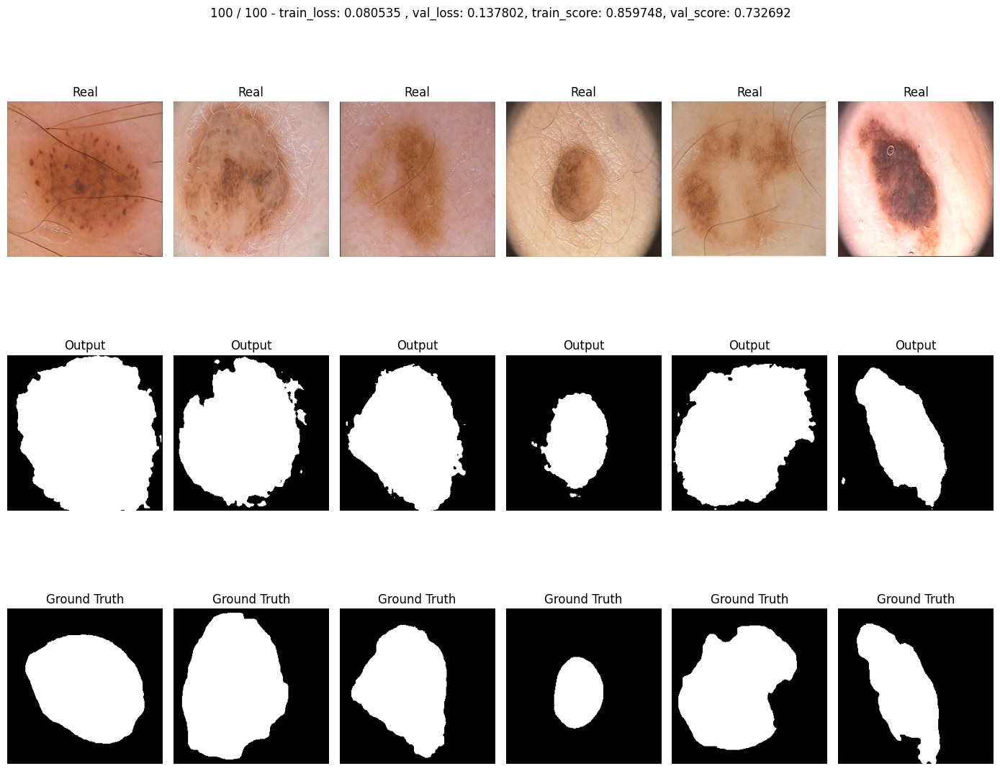

In [57]:
model_dice = SegNet().to(device)

optimizer = torch.optim.AdamW(model_dice.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_segnet_dice = train(model_dice, optimizer, dice_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [58]:
segnet_dice_val_score, segnet_dice_test_score = scores(model_dice)


Score на валидации: 0.7301, score на тесте: 0.7050


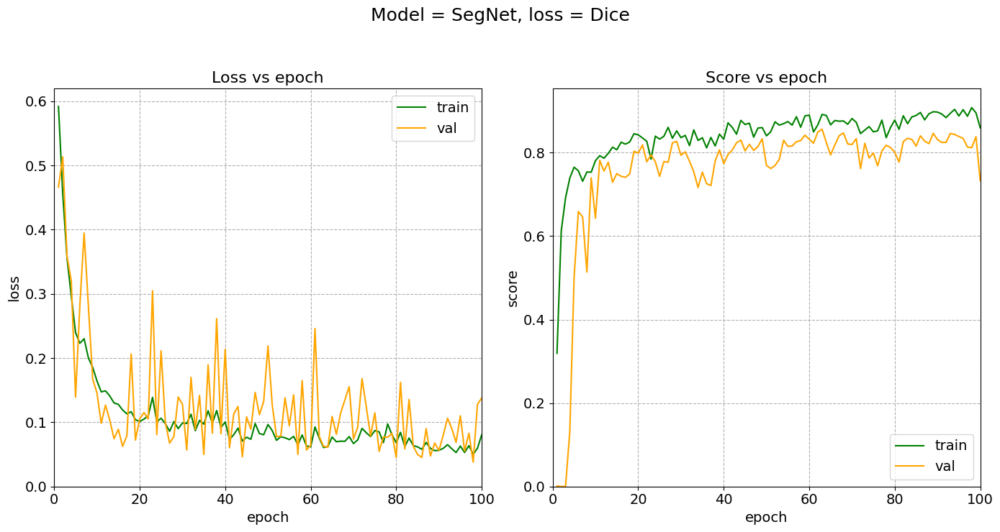

In [59]:
make_graph(h_segnet_dice, "SegNet", "Dice")

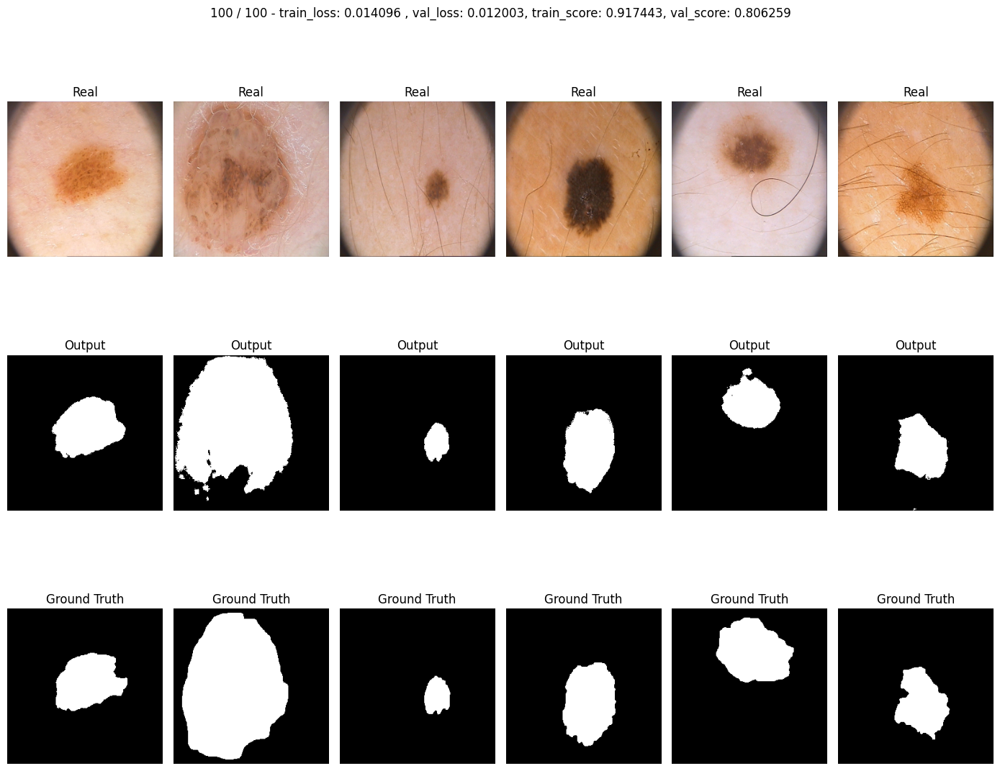

In [60]:
model_focal = SegNet().to(device)

optimizer = torch.optim.AdamW(model_focal.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_segnet_focal = train(model_focal, optimizer, focal_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [61]:

segnet_focal_val_score, segnet_focal_test_score = scores(model_focal)


Score на валидации: 0.8427, score на тесте: 0.7864


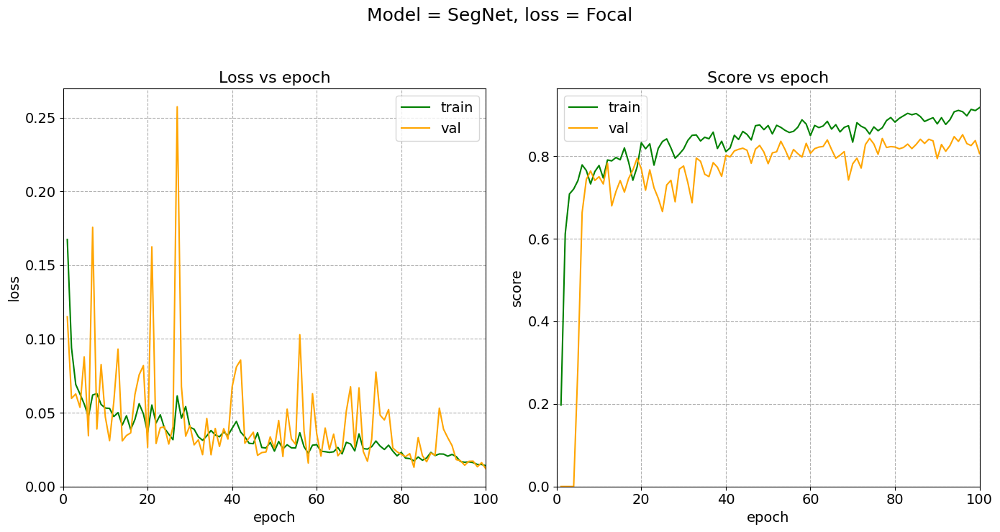

In [62]:
make_graph(h_segnet_focal, "SegNet", "Focal")

In [63]:
model_focal.to("cpu")
del model_focal
torch.cuda.empty_cache()

**SegNet weakly supervised**

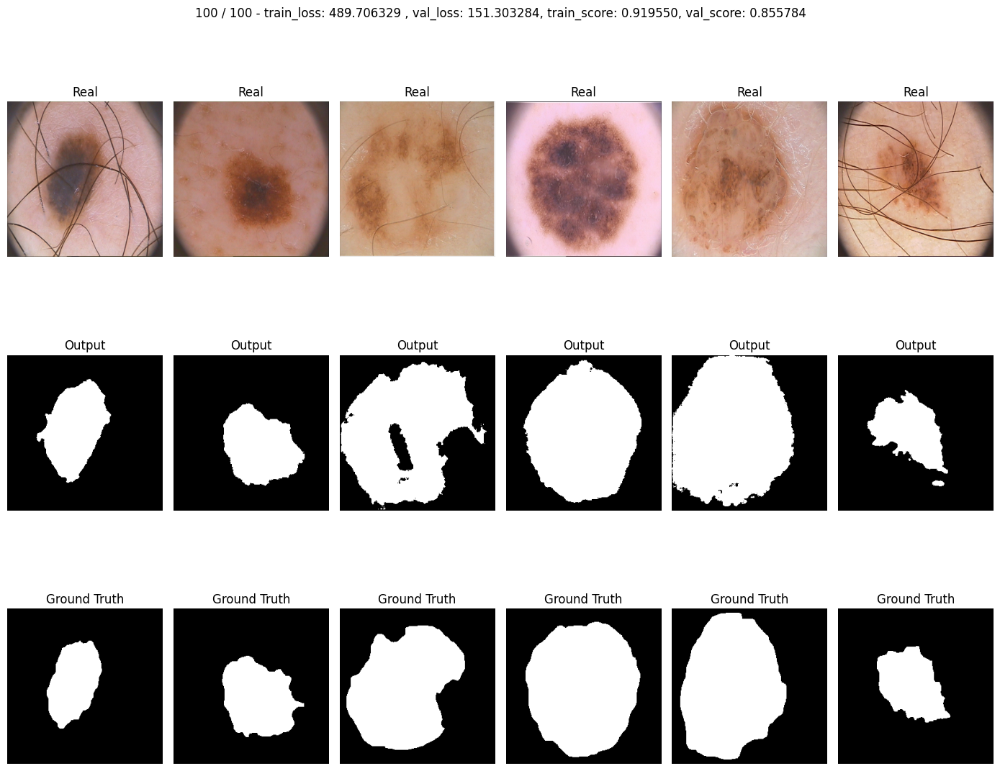

In [64]:
model_weakly = SegNet().to(device)
optimizer = torch.optim.AdamW(model_weakly.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_segnet_weakly = train(model_weakly, optimizer, supervised_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [65]:
segnet_weakly_val_score, segnet_weakly_test_score = scores(model_weakly)


Score на валидации: 0.8296, score на тесте: 0.8480


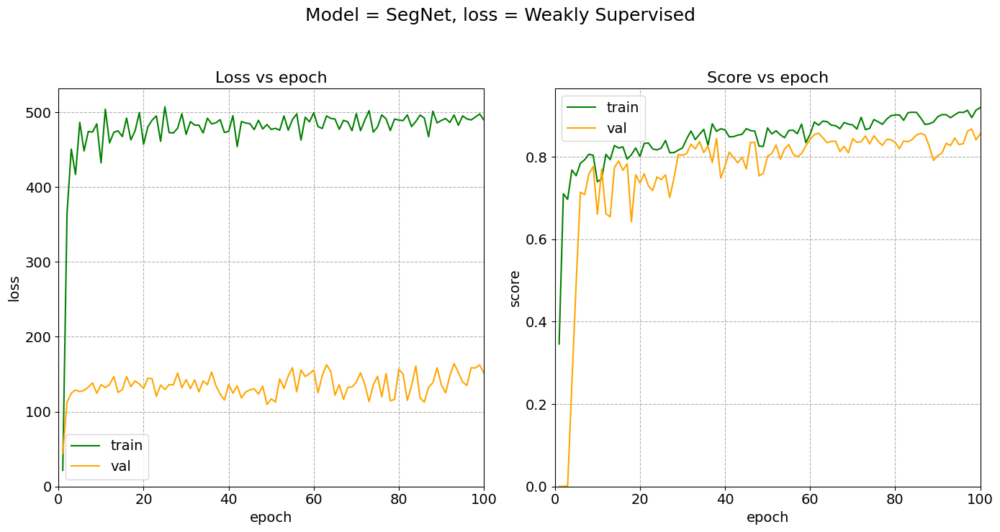

In [66]:
make_graph(h_segnet_weakly, "SegNet", "Weakly Supervised")

In [67]:
model_weakly.to("cpu")
del model_weakly
torch.cuda.empty_cache()

-----------------------------------------------------------------------------------------
<a id="14"></a> <br>
## 8.2 U-Net

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

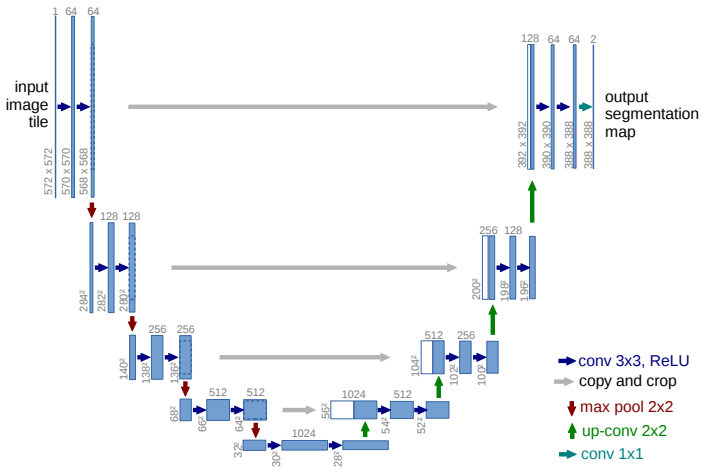

В архитектуре существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [68]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        input_nbr = 3 #Число каналов входного изображения
        num_ch = 64 #Число каналов после свертки
        batchNorm_momentum = 0.1

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=input_nbr, out_channels = num_ch, kernel_size=3, padding = (1,1)),  
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool0 = nn.MaxPool2d(kernel_size = 2, return_indices = False)
        
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool1 = nn.MaxPool2d(kernel_size = 2, return_indices = False)
        
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels= num_ch*2, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool2 = nn.MaxPool2d(kernel_size = 2, return_indices = False)
        
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),        
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool3 = nn.MaxPool2d(kernel_size = 2, return_indices = False)
            
          
        self.bottleneck_enc = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*16, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*16, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )        
                             
            
        # decoder (upsampling)
        self.upsample0 =  nn.Upsample(scale_factor=2)
        
        self.dec_conv0 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )       
        
        self.upsample1 =  nn.Upsample(scale_factor=2)
        
        self.dec_conv1 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.upsample2 =  nn.Upsample(scale_factor=2)
        
        self.dec_conv2 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample3 = nn.Upsample(scale_factor=2) 
        
        self.dec_conv3 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=1, kernel_size=1)
        )
        
        
        
    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.pool0(e0)
        e2 = self.enc_conv1(e1)
        e3 = self.pool1(e2)
        e4 = self.enc_conv2(e3)
        e5 = self.pool2(e4)
        e6 = self.enc_conv3(e5)
        e7 = self.pool3(e6)

        # bottleneck
        b = self.bottleneck_enc(e7)

        # decoder
        d0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((d0,e6), dim =1))
        d1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((d1,e4), dim =1))        
        d2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((d2,e2), dim =1))           
        d3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((d3,e0), dim =1))  
        return d3

**Unet BCE**

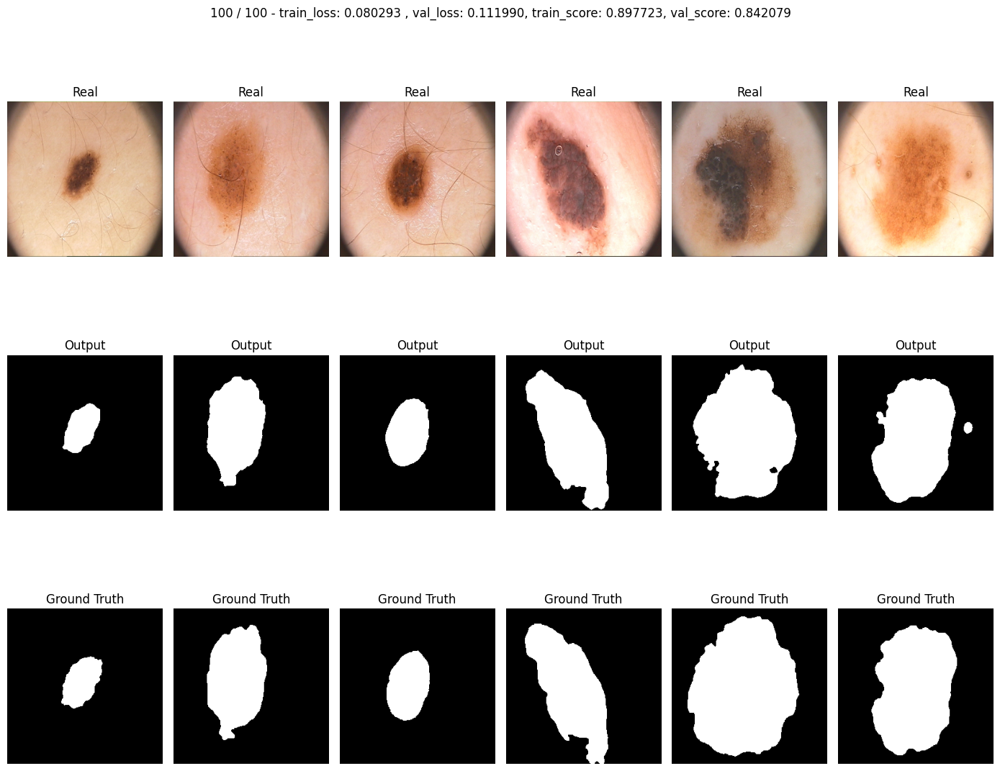

In [69]:
unet_bce = UNet().to(device)

optimizer = torch.optim.AdamW(unet_bce.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet_bce = train(unet_bce, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [70]:
unet_bce_val_score, unet_bce_test_score = scores(unet_bce)


Score на валидации: 0.8327, score на тесте: 0.8556


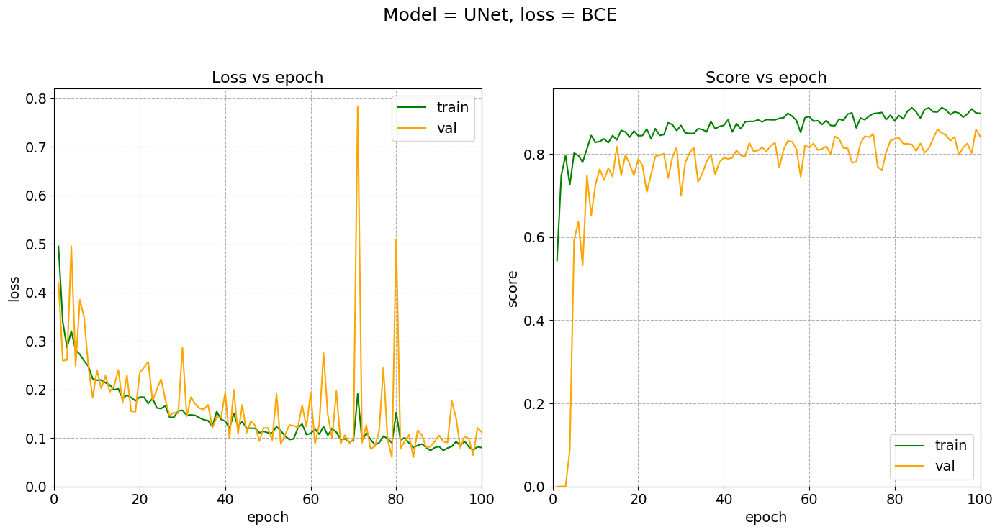

In [71]:
make_graph(h_unet_bce, "UNet", "BCE")

In [72]:
unet_bce.to("cpu")
del unet_bce
torch.cuda.empty_cache()

**Unet DICE**

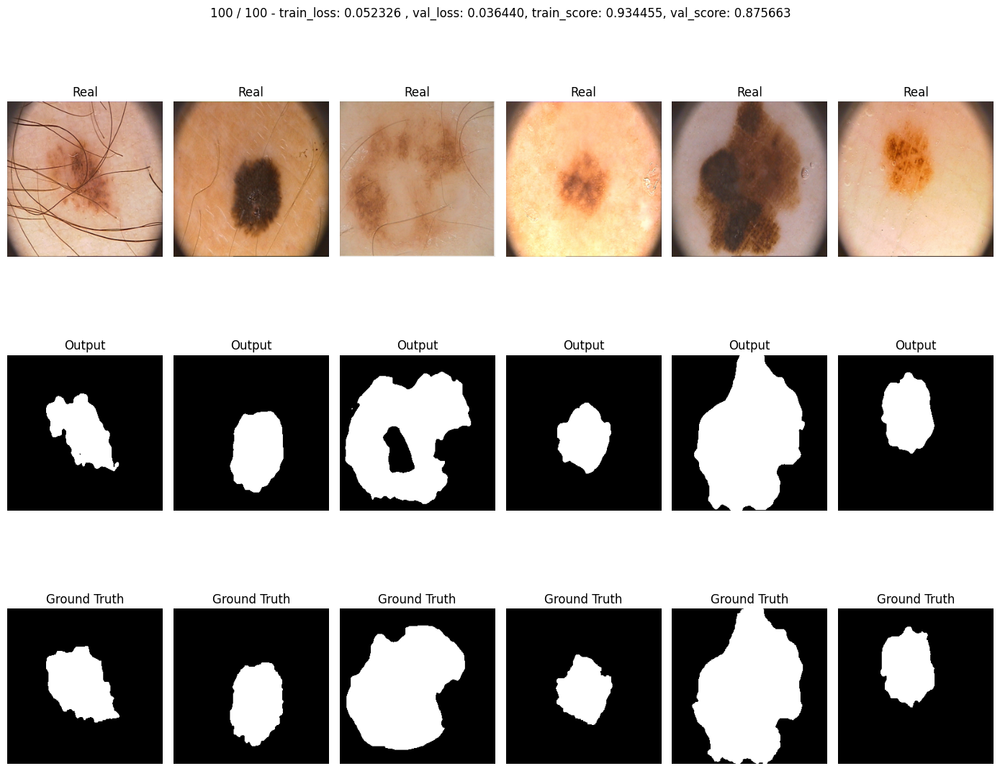

In [73]:
unet_dice = UNet().to(device)

optimizer = torch.optim.AdamW(unet_dice.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet_dice = train(unet_dice, optimizer, dice_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [74]:
unet_dice_val_score, unet_dice_test_score = scores(unet_dice)


Score на валидации: 0.8606, score на тесте: 0.8366


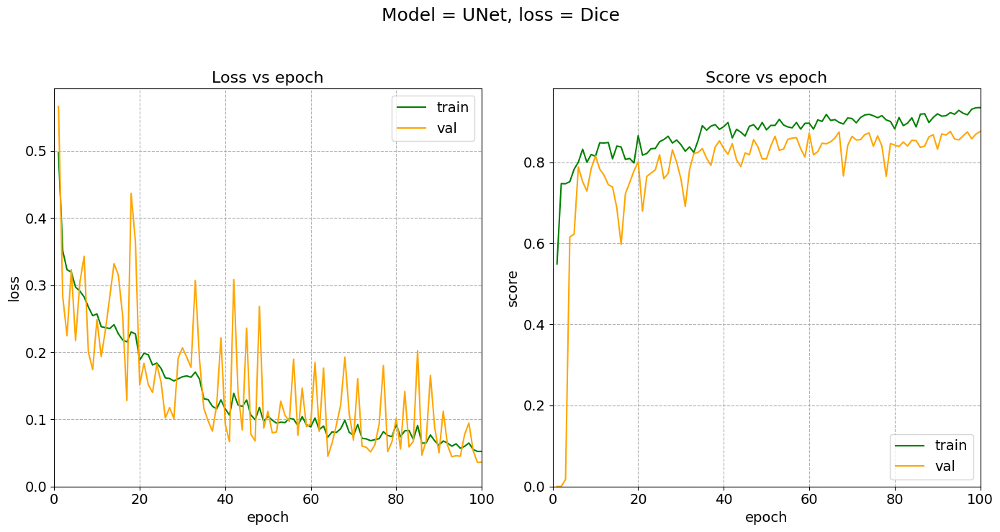

In [75]:
make_graph(h_unet_dice, "UNet", "Dice")

In [76]:
unet_dice.to("cpu")
del unet_dice
torch.cuda.empty_cache()

**Unet Focal loss**

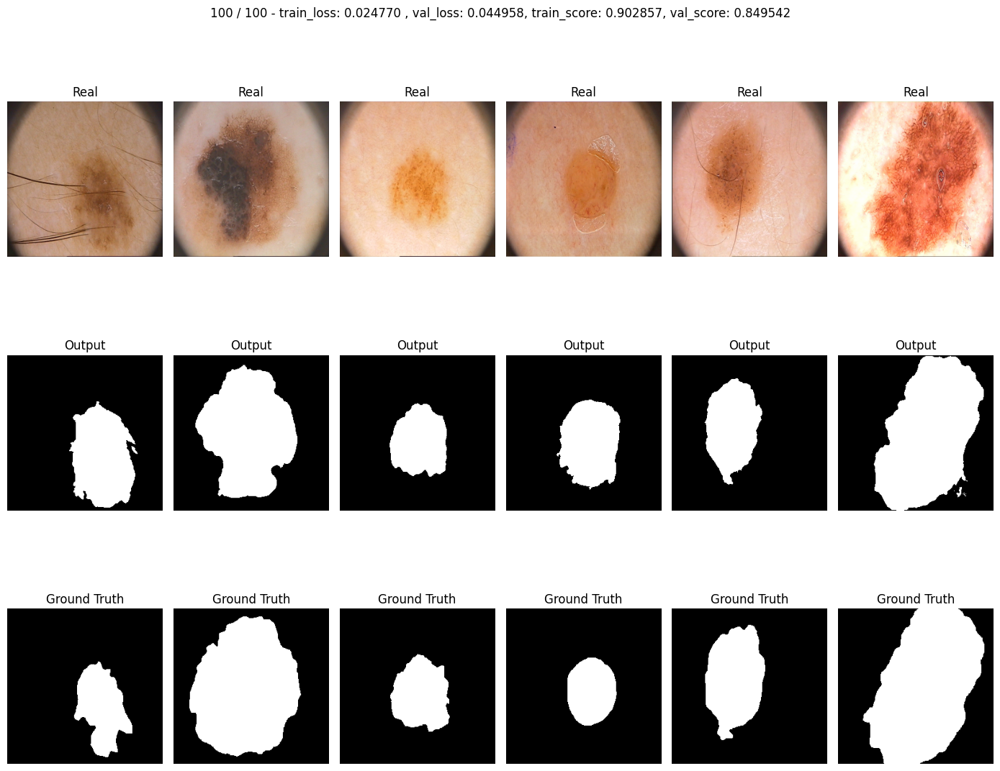

In [77]:
unet_focal = UNet().to(device)

optimizer = torch.optim.AdamW(unet_focal.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet_focal = train(unet_focal, optimizer, focal_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [78]:
unet_focal_val_score, unet_focal_test_score = scores(unet_focal)


Score на валидации: 0.8500, score на тесте: 0.8604


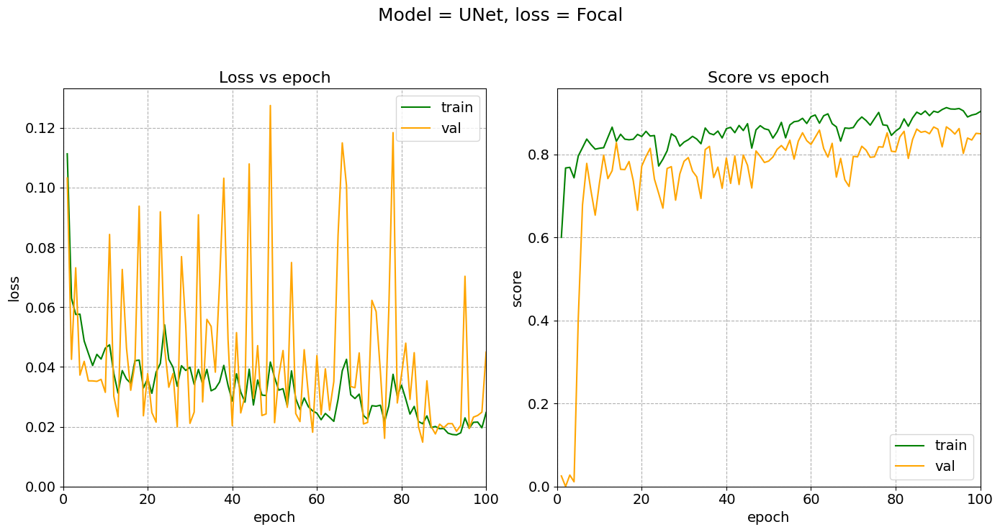

In [79]:
make_graph(h_unet_focal, "UNet", "Focal")

In [80]:
unet_focal.to("cpu")
del unet_focal
torch.cuda.empty_cache()

**UNet weakly supervised**

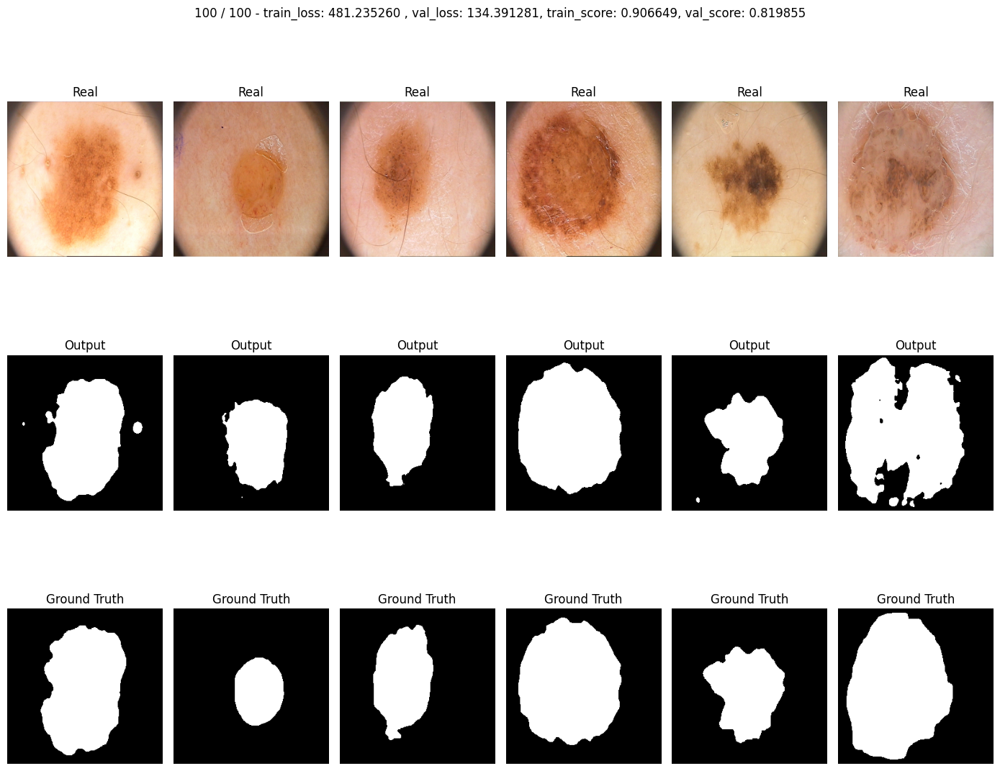

In [81]:
unet_weakly = UNet().to(device)

optimizer = torch.optim.AdamW(unet_weakly.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet_weakly = train(unet_weakly, optimizer, supervised_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [82]:
unet_weakly_val_score, unet_weakly_test_score = scores(unet_weakly)


Score на валидации: 0.8387, score на тесте: 0.8374


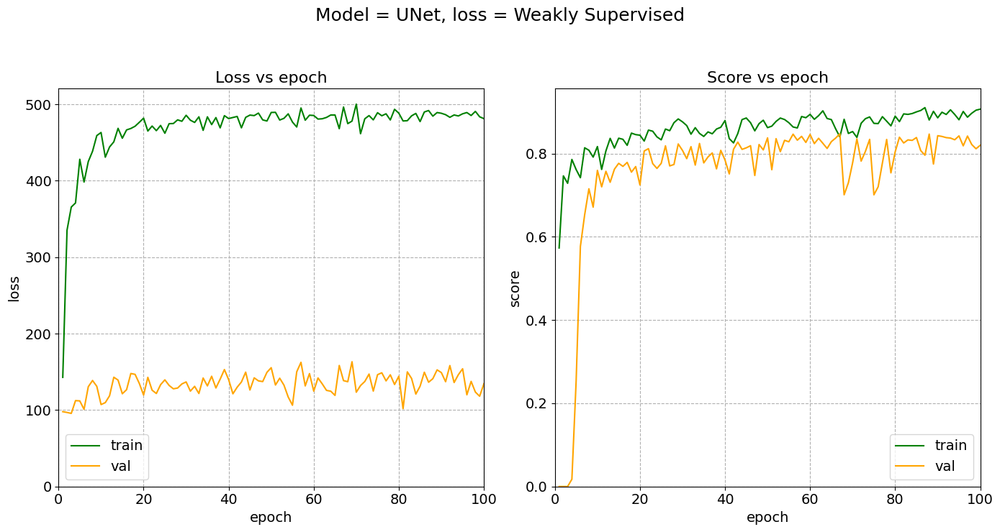

In [83]:
make_graph(h_unet_weakly, "UNet", "Weakly Supervised")

In [84]:
unet_weakly.to("cpu")
del unet_weakly
torch.cuda.empty_cache()

<a id="15"></a> <br>
## 8.3 U-Net2

Модернизируем модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Заменим max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [85]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        input_nbr = 3 #Число каналов входного изображения
        num_ch = 64 #Число каналов после свертки
        batchNorm_momentum = 0.1

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=input_nbr, out_channels = num_ch, kernel_size=3, padding = (1,1)),  
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool0 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch, out_channels = num_ch, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch),
            nn.ReLU()
        )

        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool1 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*2, out_channels = num_ch*2, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*2),
            nn.ReLU()
        )
        
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels= num_ch*2, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool2 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels = num_ch*4, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*4),
            nn.ReLU()
        )
        
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),        
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool3 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels = num_ch*8, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU()
        )
            
        self.bottleneck_enc = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*16, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*16, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )        
                             
            
        # decoder (upsampling)
        self.upsample0 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*8, out_channels = num_ch*8, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU()
        )
        
        self.dec_conv0 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )       
        
        self.upsample1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*4, out_channels = num_ch*4, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*4),
            nn.ReLU()
        )
        
        self.dec_conv1 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.upsample2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*2, out_channels = num_ch*2, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*2),
            nn.ReLU()
        )
        
        self.dec_conv2 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch, out_channels = num_ch, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch),
            nn.ReLU()
        )
        
        self.dec_conv3 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=1, kernel_size=1)
        )
        
        
        
    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.pool0(e0)
        e2 = self.enc_conv1(e1)
        e3 = self.pool1(e2)
        e4 = self.enc_conv2(e3)
        e5 = self.pool2(e4)
        e6 = self.enc_conv3(e5)
        e7 = self.pool3(e6)

        # bottleneck
        b = self.bottleneck_enc(e7)

        # decoder
        d0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((d0,e6), dim =1))
        d1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((d1,e4), dim =1))        
        d2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((d2,e2), dim =1))           
        d3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((d3,e0), dim =1))  
        return d3


In [85]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        input_nbr = 3 #Число каналов входного изображения
        num_ch = 64 #Число каналов после свертки
        batchNorm_momentum = 0.1

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=input_nbr, out_channels = num_ch, kernel_size=3, padding = (1,1)),  
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool0 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch, out_channels = num_ch, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch),
            nn.ReLU()
        )

        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_ch, out_channels = num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool1 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*2, out_channels = num_ch*2, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*2),
            nn.ReLU()
        )
        
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels= num_ch*2, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool2 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels = num_ch*4, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*4),
            nn.ReLU()
        )
        
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),        
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.pool3 = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels = num_ch*8, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU()
        )
            
        self.bottleneck_enc = nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*16, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*16, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU()
        )        
                             
            
        # decoder (upsampling)
        self.upsample0 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*8, out_channels = num_ch*8, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*8),
            nn.ReLU()
        )
        
        self.dec_conv0 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*16, out_channels=num_ch*8, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*8, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU()
        )       
        
        self.upsample1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*4, out_channels = num_ch*4, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*4),
            nn.ReLU()
        )
        
        self.dec_conv1 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*8, out_channels=num_ch*4, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*4, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU()
        )
        
        self.upsample2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch*2, out_channels = num_ch*2, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch*2),
            nn.ReLU()
        )
        
        self.dec_conv2 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*4, out_channels=num_ch*2, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch*2, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),           
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU()
        )

        self.upsample3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_ch, out_channels = num_ch, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(num_ch),
            nn.ReLU()
        )
        
        self.dec_conv3 =  nn.Sequential(
            nn.Conv2d(in_channels=num_ch*2, out_channels=num_ch, kernel_size=3, padding = (1,1)),            
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=num_ch, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(num_ch, momentum= batchNorm_momentum),
            nn.ReLU(),
            nn.Conv2d(in_channels=num_ch, out_channels=1, kernel_size=1)
        )
        
        
        
    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.pool0(e0)
        e2 = self.enc_conv1(e1)
        e3 = self.pool1(e2)
        e4 = self.enc_conv2(e3)
        e5 = self.pool2(e4)
        e6 = self.enc_conv3(e5)
        e7 = self.pool3(e6)

        # bottleneck
        b = self.bottleneck_enc(e7)

        # decoder
        d0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((d0,e6), dim =1))
        d1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((d1,e4), dim =1))        
        d2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((d2,e2), dim =1))           
        d3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((d3,e0), dim =1))  
        return d3


**Unet2 BCE**

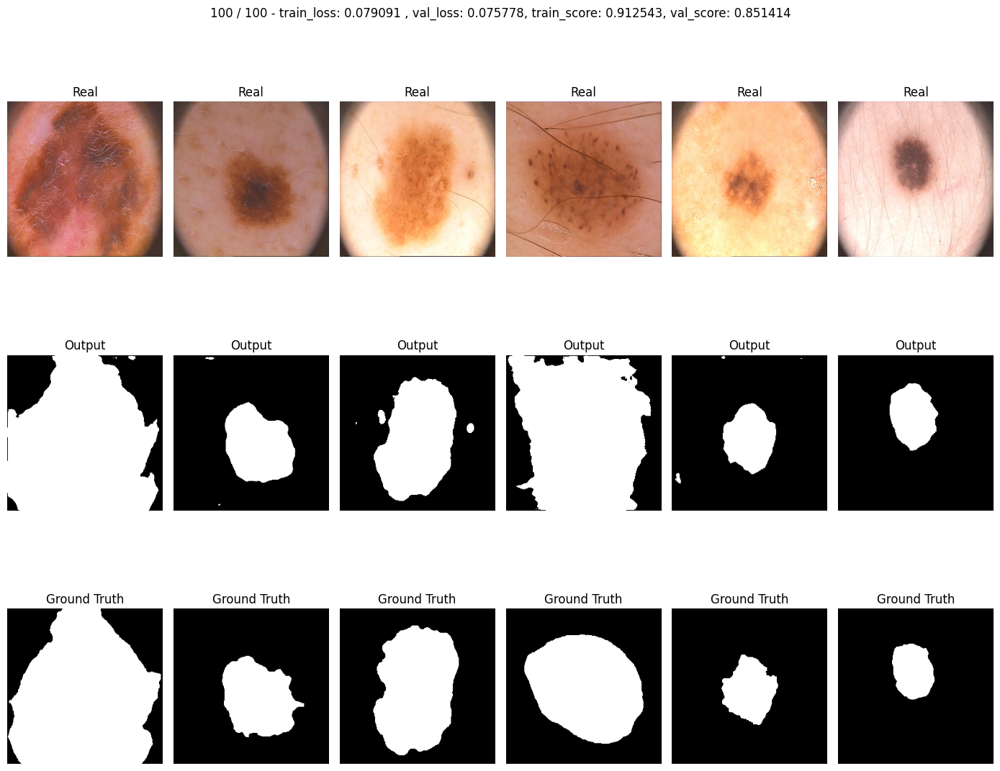

In [86]:
unet2_bce = UNet2().to(device)

optimizer = torch.optim.AdamW(unet2_bce.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet2_bce = train(unet2_bce, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [87]:
unet2_bce_val_score, unet2_bce_test_score = scores(unet2_bce)


Score на валидации: 0.8294, score на тесте: 0.8453


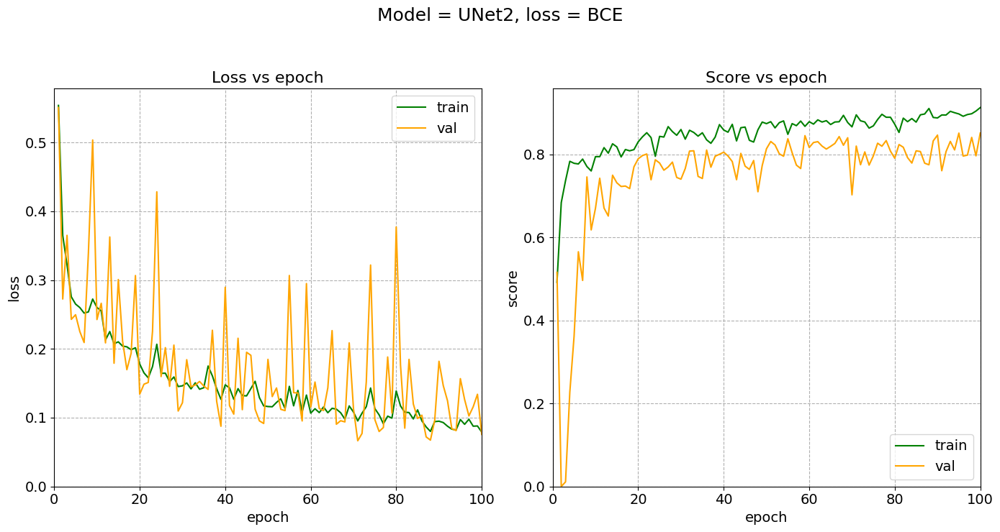

In [88]:
make_graph(h_unet2_bce, "UNet2", "BCE")

In [89]:
unet2_bce.to("cpu")
del unet2_bce
torch.cuda.empty_cache()

**Unet2 DICE**

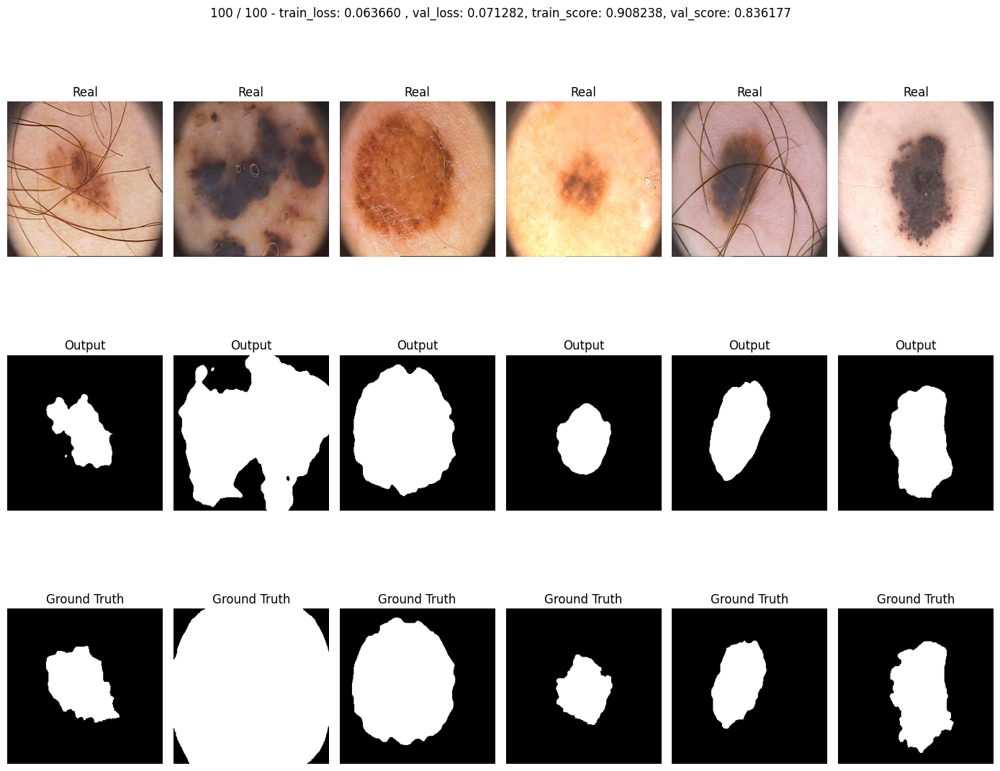

In [90]:
unet2_dice = UNet2().to(device)

optimizer = torch.optim.AdamW(unet2_dice.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet2_dice = train(unet2_dice, optimizer, dice_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [91]:
unet2_dice_val_score, unet2_dice_test_score = scores(unet2_dice)


Score на валидации: 0.8366, score на тесте: 0.8617


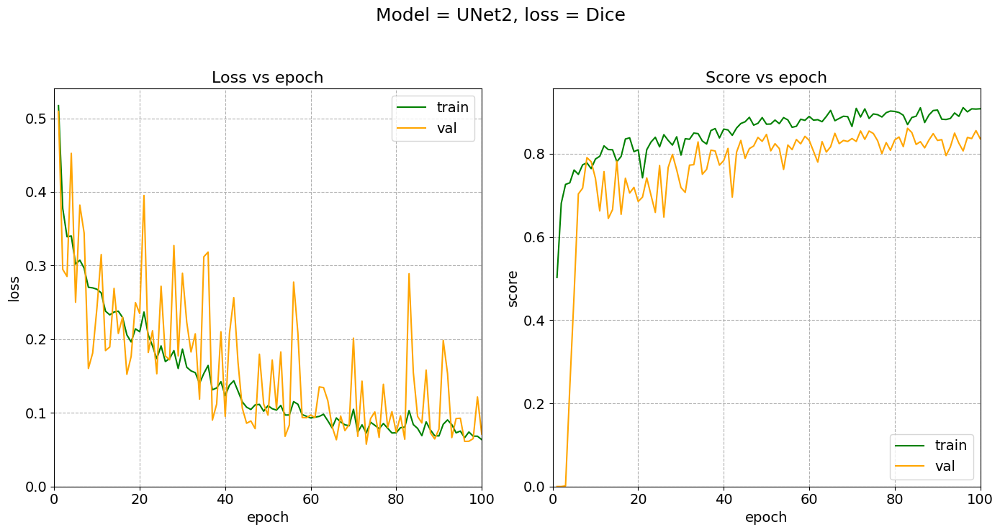

In [92]:
make_graph(h_unet2_dice, "UNet2", "Dice")

In [93]:
unet2_dice.to("cpu")
del unet2_dice
torch.cuda.empty_cache()

**Unet2 FOCAL LOSS**

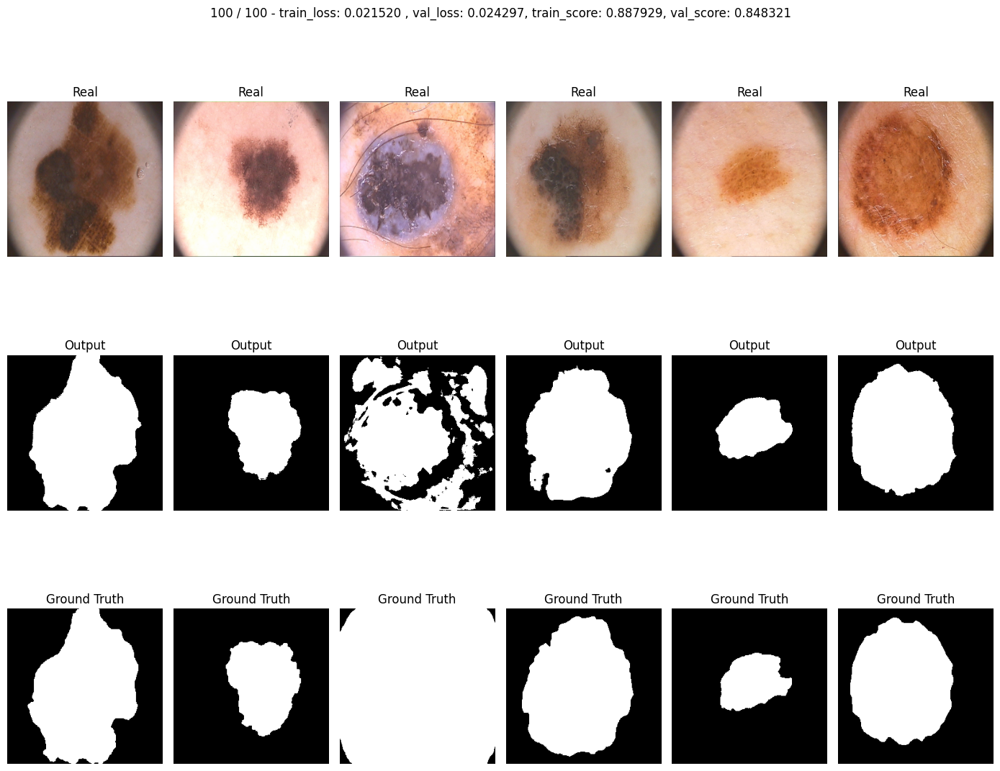

In [94]:
unet2_focal = UNet2().to(device)

optimizer = torch.optim.AdamW(unet2_focal.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet2_focal = train(unet2_focal, optimizer, focal_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [95]:
unet2_focal_val_score, unet2_focal_test_score = scores(unet2_focal)


Score на валидации: 0.8423, score на тесте: 0.8434


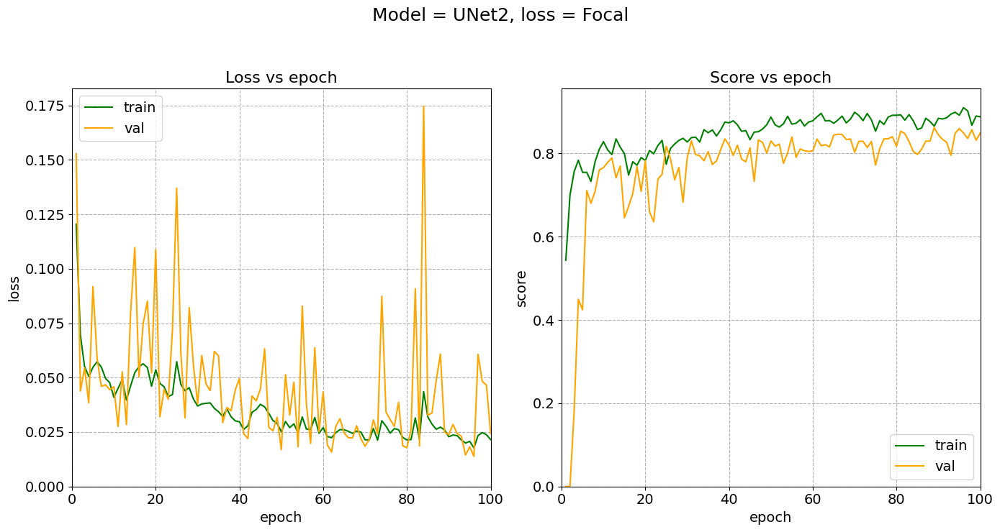

In [96]:
make_graph(h_unet2_focal, "UNet2", "Focal")

In [97]:
unet2_focal.to("cpu")
del unet2_focal
torch.cuda.empty_cache()

**Unet2 weakly supervised**

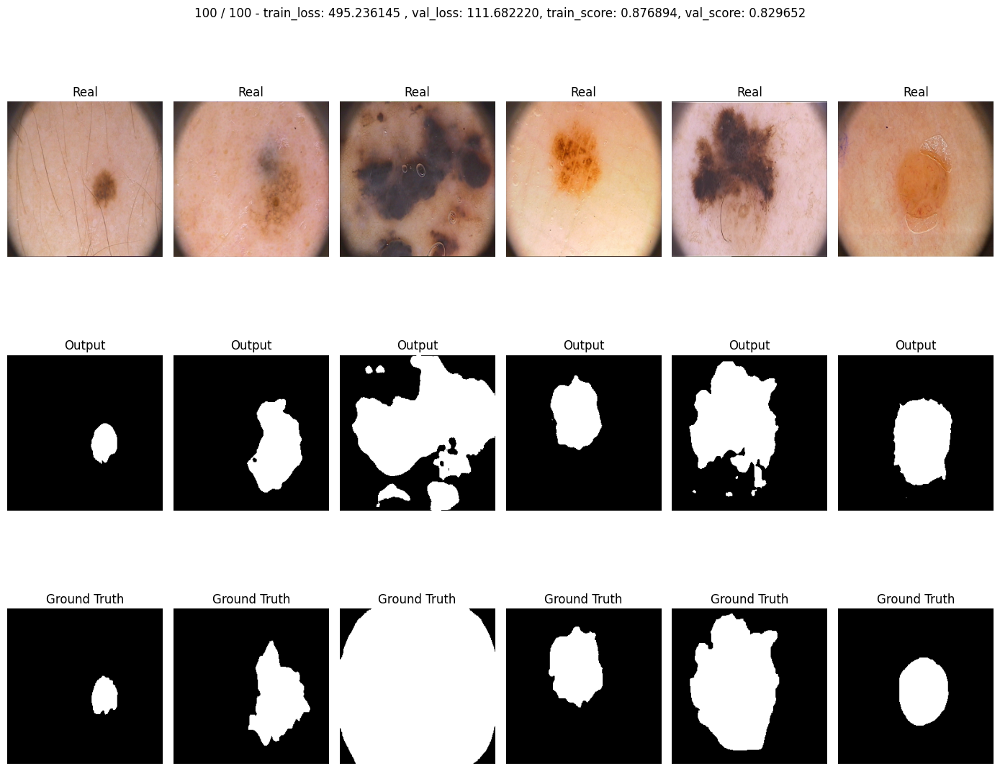

In [98]:
unet2_weakly = UNet2().to(device)

optimizer = torch.optim.AdamW(unet2_weakly.parameters(), lr = BASE_LR, betas=(0.9, 0.999), eps=1e-8, weight_decay=WEIGHT_DECAY, amsgrad=AMSGRAD)
h_unet2_weakly = train(unet2_weakly, optimizer, supervised_loss, MAX_EPOCHS, data_tr, data_val, used_sheduler=True)

In [99]:
unet2_weakly_val_score, unet2_weakly_test_score = scores(unet2_weakly)


Score на валидации: 0.8505, score на тесте: 0.8408


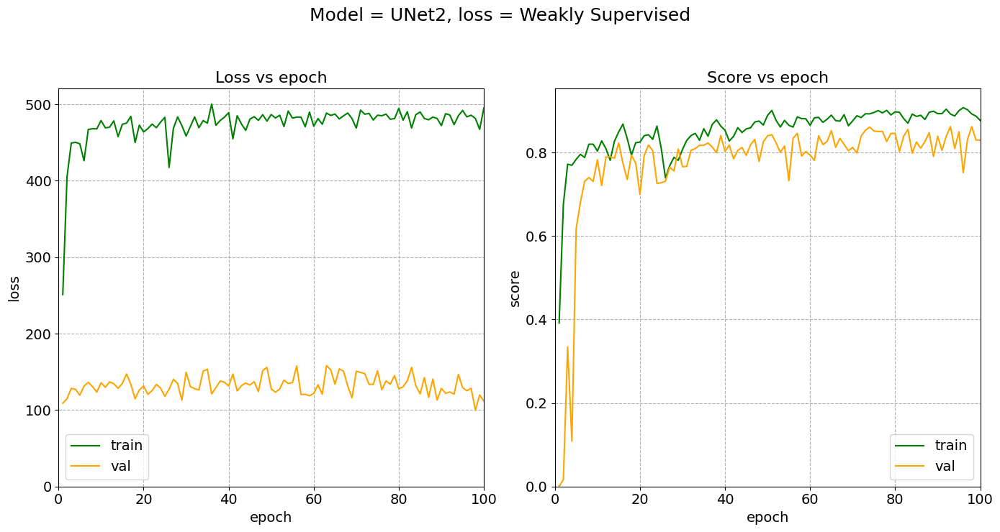

In [100]:
make_graph(h_unet2_weakly, "UNet2", "Weakly Supervised")

In [101]:
unet2_weakly.to("cpu")
del unet2_weakly
torch.cuda.empty_cache()

<a id="16"></a> <br>
## 9 **Анализ результатов по эпохам обучения**

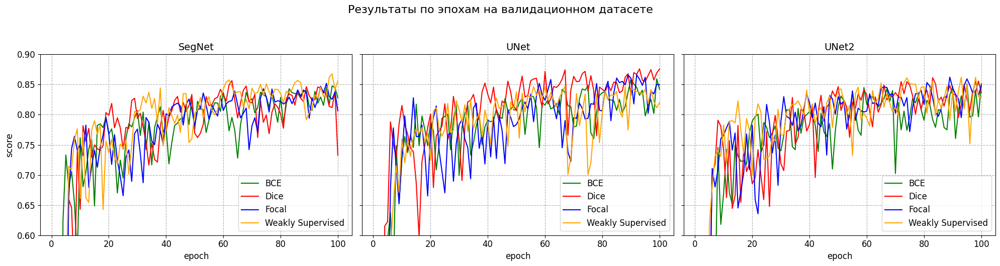

In [115]:
x = np.arange(100)+1
fig, ax = plt.subplots(1, 3, figsize = (20, 5), sharey = True)

y1 = h_segnet_bce["val"]["score"]
y2 = h_segnet_dice["val"]["score"]
y3 = h_segnet_focal["val"]["score"]
y4 = h_segnet_weakly["val"]["score"]
ax[0].plot(x, y1, label = "BCE", color = "green")
ax[0].plot(x, y2, label = "Dice", color = "red")
ax[0].plot(x, y3, label = "Focal", color = "blue")
ax[0].plot(x, y4, label = "Weakly Supervised", color = "orange")
ax[0].legend(fontsize = 12)
ax[0].grid(linestyle = "--")
ax[0].tick_params(labelsize = 12)
ax[0].set_ylabel("score", fontsize = 13)
ax[0].set_title("SegNet", fontsize = 14)
ax[0].set_xlabel("epoch", fontsize = 12)
ax[0].set_ylim(0.0, 0.9)

y1 = h_unet_bce["val"]["score"]
y2 = h_unet_dice["val"]["score"]
y3 = h_unet_focal["val"]["score"]
y4 = h_unet_weakly["val"]["score"]
ax[1].plot(x, y1, label = "BCE", color = "green")
ax[1].plot(x, y2, label = "Dice", color = "red")
ax[1].plot(x, y3, label = "Focal", color = "blue")
ax[1].plot(x, y4, label = "Weakly Supervised", color = "orange")
ax[1].legend(fontsize = 12)
ax[1].grid(linestyle = "--")
ax[1].tick_params(labelsize = 12)
ax[1].set_title("UNet", fontsize = 14)
ax[1].set_xlabel("epoch", fontsize = 12)
ax[1].set_ylim(0.0, 0.9)

y1 = h_unet2_bce["val"]["score"]
y2 = h_unet2_dice["val"]["score"]
y3 = h_unet2_focal["val"]["score"]
y4 = h_unet2_weakly["val"]["score"]
ax[2].plot(x, y1, label = "BCE", color = "green")
ax[2].plot(x, y2, label = "Dice", color = "red")
ax[2].plot(x, y3, label = "Focal", color = "blue")
ax[2].plot(x, y4, label = "Weakly Supervised", color = "orange")
ax[2].legend(fontsize = 12)
ax[2].grid(linestyle = "--")
ax[2].tick_params(labelsize = 12)
ax[2].set_title("UNet2", fontsize = 14)
ax[2].set_xlabel("epoch", fontsize = 12)
ax[2].set_ylim(0.6, 0.9)
plt.suptitle(f"Результаты по эпохам на валидационном датасете", fontsize = 16, y=1.05)
plt.tight_layout()
plt.show()



Графики показывают явное лидерство модели UNet с любыми лосс-функциями, второе место можно отдать модели UNet2, и далее с небольшим отрывом идет мМодель SegNet. При этом во всех моделях топовые результаты показывает Lovasz-loss и Dice-loss, в то время как Focal-loss и BCE оказались аутсайдерами.

<a id="17"></a> <br>
## 10 **Анализ графиков метрики IoU по эпохам в зависимости от loss-функции**

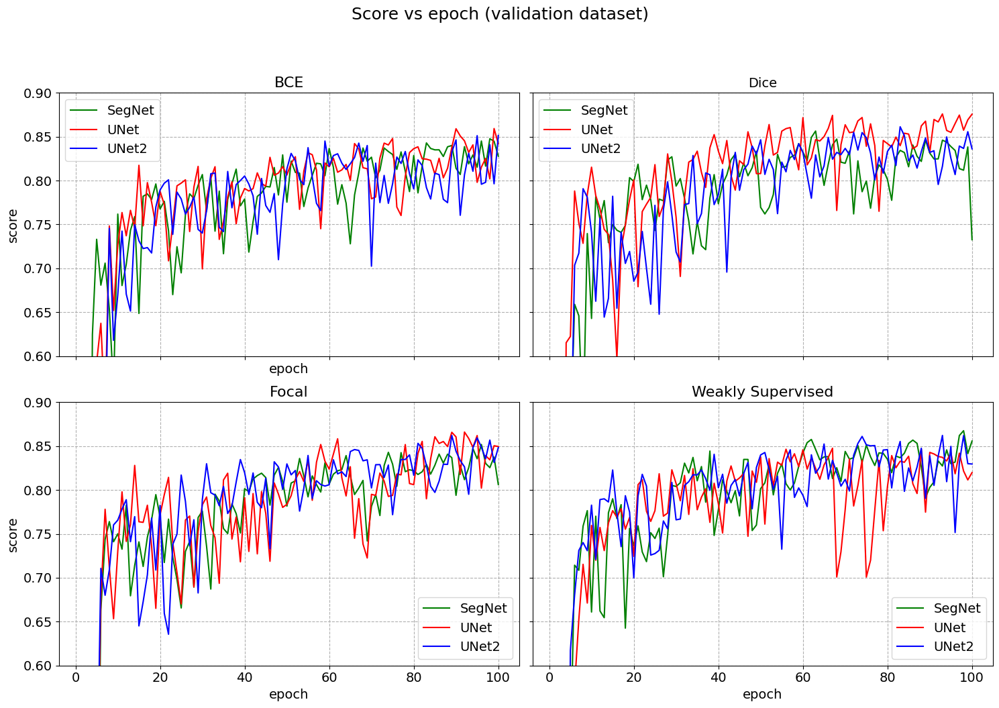

In [116]:
x = np.arange(100)+1
fig, ax = plt.subplots(2, 2, figsize = (15, 10), sharey = True, sharex = True)
y1 = h_segnet_bce["val"]["score"]
y2 = h_unet_bce["val"]["score"]
y3 = h_unet2_bce["val"]["score"]
ax[0, 0].plot(x, y1, label = "SegNet", color = "green")
ax[0, 0].plot(x, y2, label = "UNet", color = "red")
ax[0, 0].plot(x, y3, label = "UNet2", color = "blue")
ax[0, 0].legend(fontsize = 14)
ax[0, 0].grid(linestyle = "--")
ax[0, 0].tick_params(labelsize = 14)
ax[0, 0].set_ylabel("score", fontsize = 14)
ax[0, 0].set_title("BCE", fontsize = 16)
ax[0, 0].set_xlabel("epoch", fontsize = 14)
ax[0, 0].set_ylim(0.2, 0.9)

y1 = h_segnet_dice["val"]["score"]
y2 = h_unet_dice["val"]["score"]
y3 = h_unet2_dice["val"]["score"]
ax[0, 1].plot(x, y1, label = "SegNet", color = "green")
ax[0, 1].plot(x, y2, label = "UNet", color = "red")
ax[0, 1].plot(x, y3, label = "UNet2", color = "blue")
ax[0, 1].legend(fontsize = 14)
ax[0, 1].grid(linestyle = "--")
ax[0, 1].tick_params(labelsize = 16)
ax[0, 1].set_title("Dice", fontsize = 14)
ax[0, 1].set_ylim(0.0, 0.9)


y1 = h_segnet_focal["val"]["score"]
y2 = h_unet_focal["val"]["score"]
y3 = h_unet2_focal["val"]["score"]
ax[1, 0].plot(x, y1, label = "SegNet", color = "green")
ax[1, 0].plot(x, y2, label = "UNet", color = "red")
ax[1, 0].plot(x, y3, label = "UNet2", color = "blue")
ax[1, 0].legend(fontsize = 14)
ax[1, 0].grid(linestyle = "--")
ax[1, 0].tick_params(labelsize = 14)
ax[1, 0].set_ylabel("score", fontsize = 14)
ax[1, 0].set_title("Focal", fontsize = 16)
ax[1, 0].set_xlabel("epoch", fontsize = 14)
ax[1, 0].set_ylim(0.0, 0.9)


y1 = h_segnet_weakly["val"]["score"]
y2 = h_unet_weakly["val"]["score"]
y3 = h_unet2_weakly["val"]["score"]
ax[1, 1].plot(x, y1, label = "SegNet", color = "green")
ax[1, 1].plot(x, y2, label = "UNet", color = "red")
ax[1, 1].plot(x, y3, label = "UNet2", color = "blue")
ax[1, 1].legend(fontsize = 14)
ax[1, 1].grid(linestyle = "--")
ax[1, 1].tick_params(labelsize = 14)
ax[1, 1].set_title("Weakly Supervised", fontsize = 16)
ax[1, 1].set_xlabel("epoch", fontsize = 14)
ax[1, 1].set_ylim(0.6, 0.9)


plt.suptitle(f"Score vs epoch (validation dataset)", fontsize = 18, y=1.05)
plt.tight_layout()
plt.show()

Данные графики иллюстрируют первенство модели Unet, Unet2 - на втором месте в среднем.  К сожалению, из-за ограничения вычислительных мощностей потребовалось ограничить размер batch`а, из-за чего на графиках присутствуют скачки

<a id="18"></a> <br>
# **11. Сравнение метрик IoU на тестовом наборе данных**

In [109]:
y = [segnet_bce_test_score, segnet_dice_test_score, segnet_focal_test_score, segnet_weakly_test_score,
     unet_bce_test_score, unet_dice_test_score, unet_focal_test_score, unet_weakly_test_score,
     unet2_bce_test_score, unet2_dice_test_score, unet2_focal_test_score, unet2_weakly_test_score]

x = ['segnet_bce', 'segnet_dice', 'segnet_focal', 'segnet_weakly',
     'unet_bce', 'unet_dice', 'unet_focal', 'unet_weakly',
     'unet2_bce', 'unet2_dice', 'unet2_focal', 'unet2_weakly']

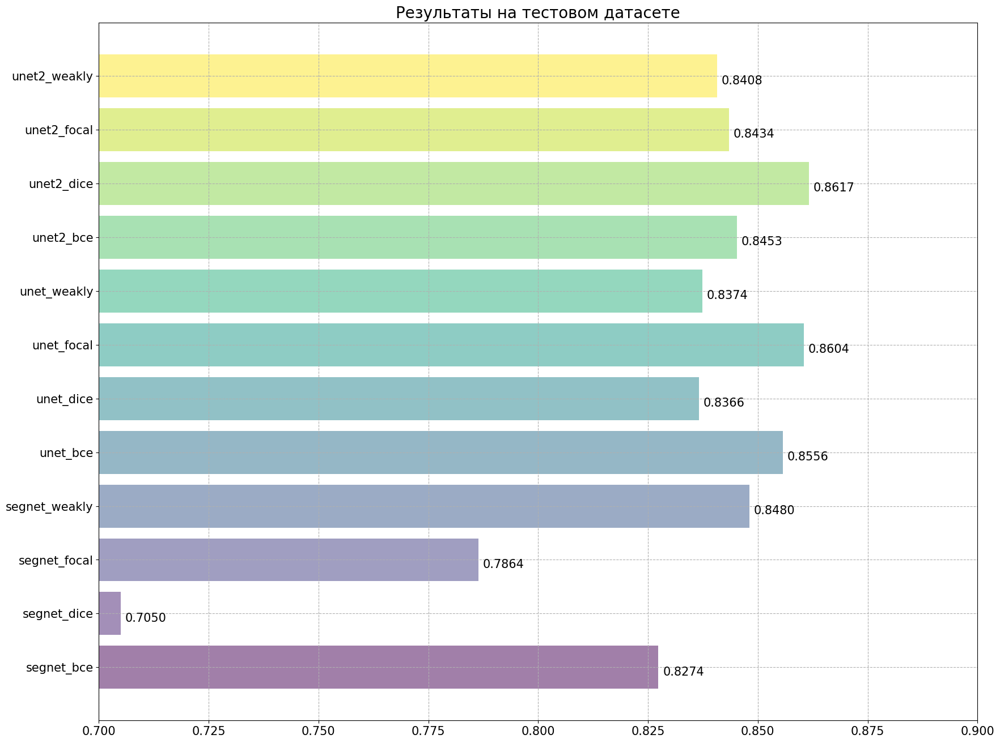

In [112]:
fig, ax = plt.subplots(figsize = (20, 16))
ax.barh(x, y, color = colors, alpha = 0.5)
ax.set_xlim(0.7, 0.9)
ax.tick_params(labelsize = 15)
for i in range(12):
    ax.text(y[i]+0.001, i - 0.15, f"{y[i]:.4f}", fontsize = 15)
    ax.grid(linestyle="--")
ax.set_title("Результаты на тестовом датасете", fontsize = 20)
plt.show()

На тестовом датасете видно, что в среднем преимущество у архитектур `UNet` относительно Segnet, однако в зависимости от функции потерь результат имеет шанс иметь схожий порядок.

<a id="19"></a> <br>
# **12. Вывод:**

* В текущем проекте проведено исследование трех сверточных нейронных сетей различных архитектур - `Segnet`, `UNet`, `UNet2`. При этом каждая их перечисленных моделей тестировалась с 4-мя разными типами функции потерь, а именно: BCE, Dice, Focal и weakly supervised regularization при неизменных прочих параметрах (количество эпох, скорость обучения, тип оптимизатора). 
* Библиотечные реализации лосс-функций не использовались.
* При обучении моделей использовался оптимизатор adamW, параметры которого подбирались несколькими итерациями в процессе обучения моделей для получения наибольших значений метрики IoU. Подобранный learning_rate и использование соответствующего scheduler-а позволило обойти проблему значительного переобучения CNN-моделей, что заметно по полученным графическим данным. Обучение всех 12-ти итераций проводено в Kaggle за 1 сеанс, но ограничение вычислительных мощностей вынудило `сократить размер батчей до 16`, что сильно заметно на скачках метрик по эпохам. Внутри каждого цикла обучения мы высвобождали VRAM на GPU от различных батч-данных, а также, после обучения конкретной модели требовался её перенос на CPU с последующим удалением и очисткой кеша.
* График loss-функций по эпохам демонстрирует в основном`отсутствие переобучения` у моделей, так как:
 - значение функции потерь для тренировочного датасета уменьшается по мере увеличения количества эпох вместе со значением функции потерь на валидационном датасете.
 - значения функции потерь на тренеровочном датасете превосходит незначительно значения на валидационном.
 
 Обе кривые плавно уменьшаются и находятся близко друг к другу, что свидетельствует о хорошем качестве обобщения модели на новых данных.
 Исключение составляют результаты всех трех моделей с loss-функцией `Weakly Supervised regularization`. Возможно это связано с тем, что она не подходит к текущему датасету, т.к. `Weakly Supervised regularization` обычно применяется, когда данные либо неполностью аннотированы, либо содержат менее детализированные аннотации. Текущий датасет хорошо размечен и содержит точные аннотации для каждой меланомы, использование слабого обучения может не сработать.
 Отчетливо наблюдается переобучение и резкое снижение характеристик у `SegNet` с loss-функцией DICE на последних эпохах (вблизи №100)

* Худшие результаты - у модели SegNet, особенно с функцией потерь DICE (здесь результат наихудший - 0.7050). В целом, DICE является хорошей метрикой для задачи сегментации, и многие современные работы успешно используют его для обучения моделей сегментации, включая SegNet. Однако, как и в любом другом случае, окончательный выбор лосс-функции может зависеть от специфики задачи и набора данных. Именно с этой функцией потерь достигнут наилучший результат - у модели `UNet2`: `0.8617`.
* В целом практически по всем метрикам лучший результат у CNN `UNet2`. Вероятно особенности данной нейросетевой модели сходятся с особенностями предоставленного датасета. 
 - Она использует типичную структуру U-Net, состоящую из кодировочной и декодировочной частей.
 - Включает несколько уровней сверток, за которыми следуют операции пониженной (кодировочная часть) и повышенной (декодировочная часть) размерности.
 - После каждой свертки применяются Batch Normalization и ReLU активации
 - В UNet2 вместо MaxPool2d используются свертки с ядром 2x2 и шагом 2, что позволяет сети обучаться параметрам понижения размерности.
 - Для повышения размерности используется nn.ConvTranspose2d в сочетании с BatchNorm и ReLU., что также позволяет обучаться параметрам повышения размерности.
 - Применяется механизм skip connections, где слои из кодировочной части конкатенируются с соответствующими слоями декодировочной части
 UNet2 имеет более сложную структуру с обучаемыми параметрами для операций понижения и повышения размерности, что может улучшить точность восстановления изображений по сравнению с UNet, где используются фиксированные операции MaxPooling и Upsampling.
 * UNet с функцией потерь FOCAL LOSS достигла практически такого же результата, как и `UNet2` с функцией DICE - `0.8604`
 * Сравнивая наблюдения можно сказать, что архетектура сверточной нейросети естественно имеет значение. Еще большее значение имеет выбор функции потерь, в соответствии с показаниями которой работает механизм обратного распространения ошибки и оптимизаторов (таких, как градиентный спуск) - подбор весов при вычислении матриц. Однако перебор сочетаний моделей с различнми функциями потерь может помочь достигнуть схожих результатов несмотря на разницу в архитектуре